# Q0 [HC #responsibility]

In [1]:
NAME = "Enjui Chang"

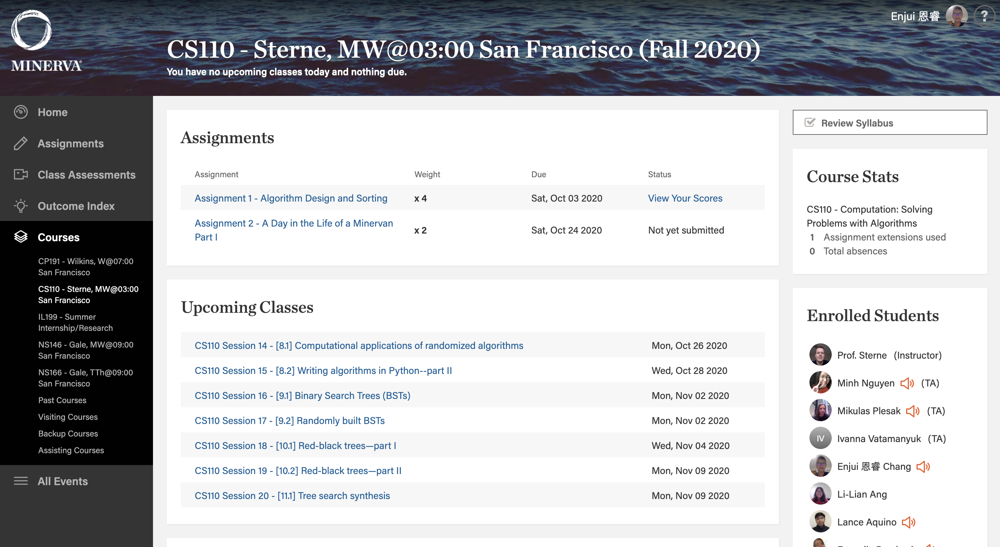

# Q1 [#ComputationalSolutions, #DataStructures]

**Prepare a table containing a list of all the activities that you plan to do in the city of your rotation, with a short, compelling justification of why they are interesting. Your activity scheduler needs to include a
minimum of 8 activities and you should make sure to include at least 1 picture (taken by yourself, or
properly referenced) per activity. **

The cultural-specific activities can be separated into three portions:
1. **Glacial landscape**
    - *Glacial moraine*: Glacial landscape is embedded in Berlin, I went to Prenzlauer Berg to take a picture of the glacial moraine just outside of Alexende Platz. This moraine is along the glacial valley or 'Urstromtal' of Berlin. This bulge of glacial tills is the result of the deposition of glacier when the glacier retreated
    - *Glacial erratics*: The other feature of glacier is glacier erratics. These are hard glaical tills that were left when the glacier retreated. This specific one was in Ruhleben, east of the center of Berlin.
2. **Kebab**
    - Due to the immigration policy in the mid-20th century, Germnay has a large population of Turkish immigrants. This also means that the Kebab, a typical Turkish food, is very common in Berlin. Mustafa Gemüse Kebab at Mehringdamm is said to be one of the best of them (according to a local friend).
3. **Eastside Gallery**
    - THe Easide Gallery is the remanants of the Berlin Wall. This portion of the wall is along the Spree river and it has been colored by artists as murals that reflect the history of Berlin.


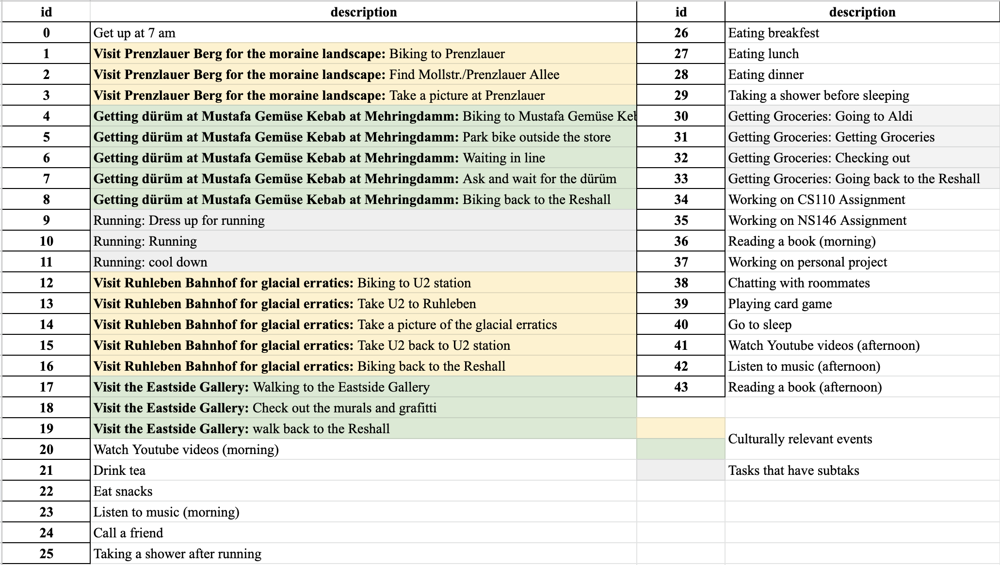

**Picture of the Glacial Moraine** (taken by myself)

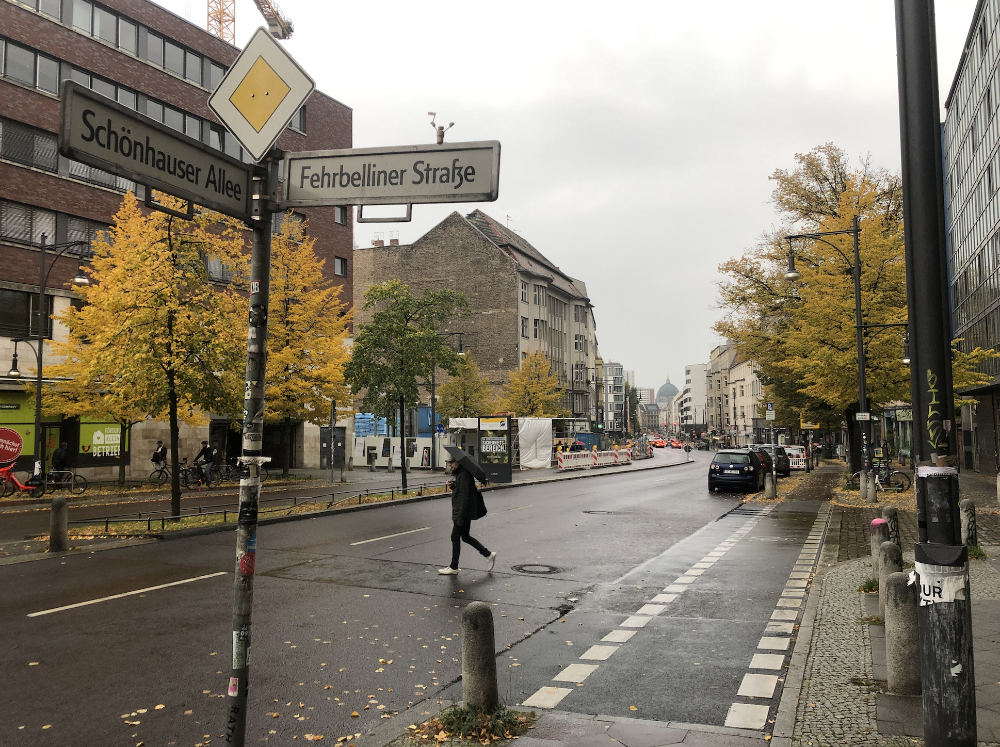

**Picture of the Glacial Erratics** (taken by myself)

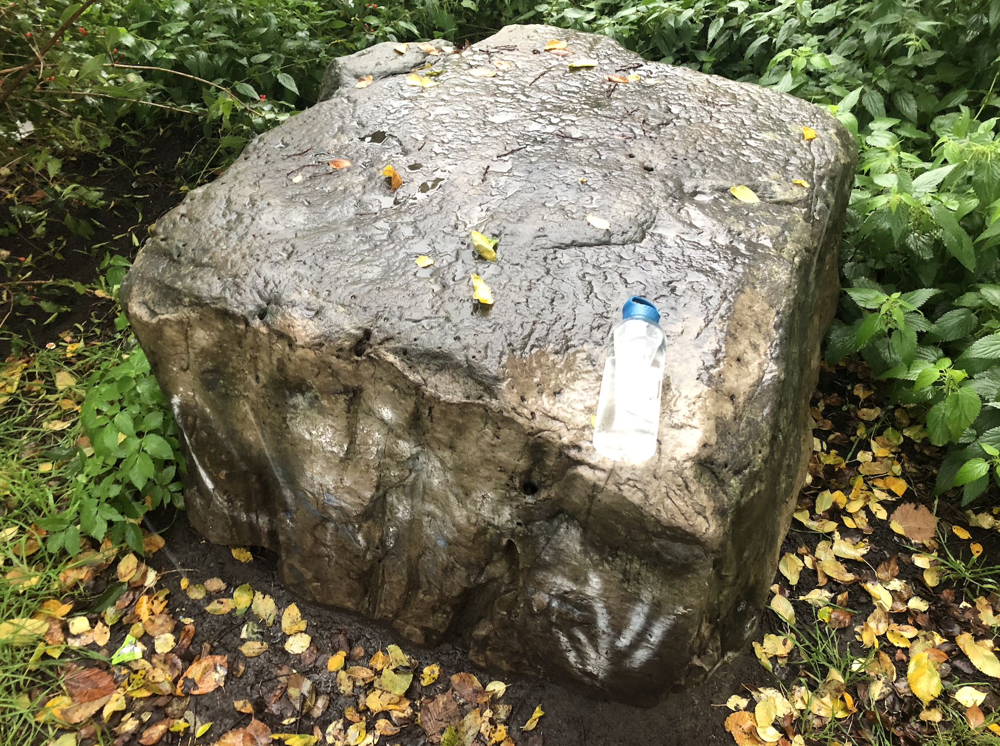

**Picture of Mustafa Gemüse Kebab** (Matthies, B., (2019), Tagasspielgel.com, Retrieved from https://www.tagesspiegel.de/berlin/neuer-standort-fuer-mustafas-gemuese-kebap-beruehmte-berliner-imbissbude-ist-wieder-geoeffnet/25250516.html)

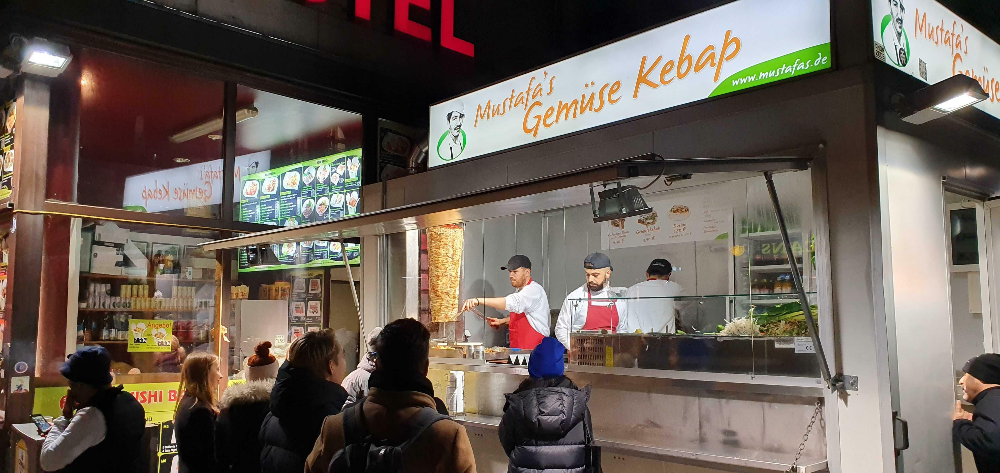 

**Picture of Eastside Gallery** (Willems, M., (2017), Eastside Gallery, Trvlmrk.com, Retrieved from https://trvlmrk.com/en/visiting-the-east-side-gallery-berlin/).

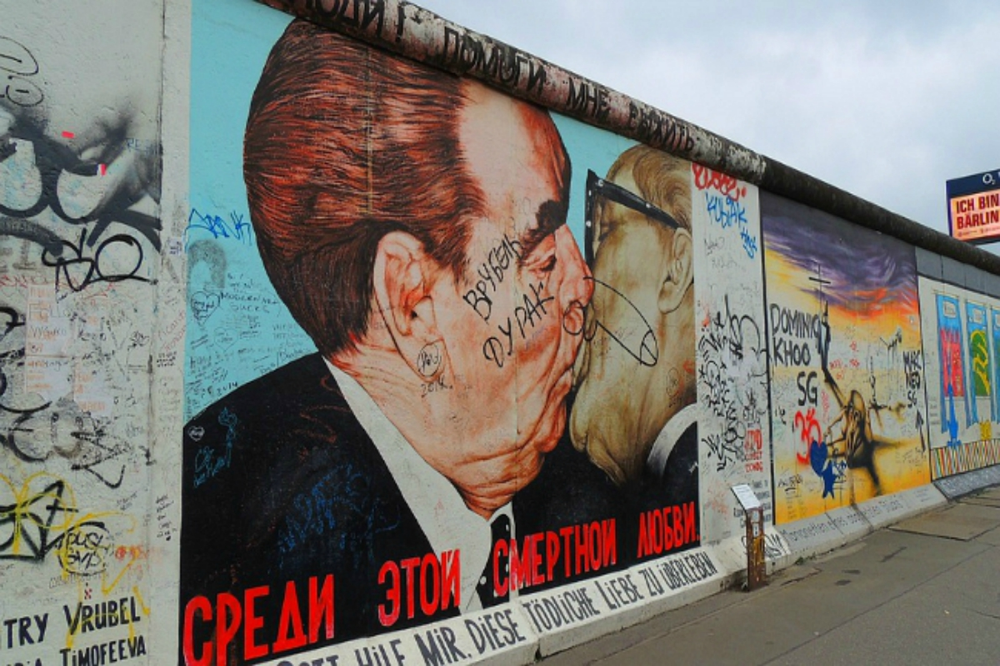

**How will you store information about these activities and sub-tasks? Describe how your scheduler will
work. Explain your answers as clearly as you can.**

- Storing information:

I stored the information as Python lists. Each task has the following charcteristics (Id, Description:Subtask, Durations, Depedencies, Time Restriction, Weight, Multi-task, Status). To separate the subtask as normal tasks, I allocated a heavy weight (10) for them compared to normal events (0.5), combined with the dependecies, my algorithm will iterate through every subtask in an event before continuing.

- Priority:
   
I used the MaxHeap priority queue to construct the algorithm. Specifically, the $duration*weight$ was the actual the parameters for the construction of the heaps. This was used to separate the different subtask and normal activities. Also, I am usually more energetic in the mornings, so I want to allocate more lengthly activities as early as possible.

- Dependency:
   
Dependecies are used for two reasons:
 1. A task that cannot be followed by another task. For example, if I have taken a shower, it doesn't make sense to go for a run afterwards.
 2. A time-dependent task. If I have an activity that I do in the afternoon, I will have it depend on lunch, since lunch is time restricted to noon.
 
The priority queue would add task (heappush) that doesn't have any dependencies after the termination of a task. This follows by heapifying and popping the maximum node, guaranteeing the sequential of subtasks (through multiplication with weights) and choosing the longest tasks first.

- Time restriction:

I created another MaxHeap priority queue for the tasks that have time restriction, for example, eating lunch and dinner. These activities would be structured the same as the normal activities, but they will not be implemented in the main priority queue. I change the sign for these time restriction (originally in the format of $mins$ of the day to $-min$), so that MaxHeap would pop out the earliest activity. This activity would be checked the global timer (c_time) and if the time matches, the activity will proceed, without impacting the other tasks.

The main priority queue will also check if the there is a time-restricted time nextby and see if the next task will delay the time-restricted task. If that happens, the algorithm would simply wait until the time-restricted task is implemented.

- General Dataflow:
   
The algotithm will check for tasks in the priority queue and unscheduled tasks that haven't not marked completed. If these two conditions are true, then the algorithm will continue to check for every task that does not have any dependencies. These will be pushed to a max heap and popped out of the priority queue. The algorithm will then iterate through a while-loop until the running time of the event is 0. This would terminate the task, remove any dependencies of it and mark the event as complete.

# Q2 [#PythonProgramming, #CodeReadability]

In [2]:
import pandas as pd

In [1]:
# Defining some basic binary tree functions
def left(i):             # left(i): takes as input the array index of a parent node in the binary tree and 
    return 2*i + 1       #          returns the array index of its left child.

def right(i):            # right(i): takes as input the array index of a parent node in the binary tree and 
    return 2*i + 2       #           returns the array index of its right child.

def parent(i):           # parent(i): takes as input the array index of a node in the binary tree and
    return (i-1)//2      #            returns the array index of its parent


# Defining the MaxHeapq class for heap operations
class MaxHeapq:
    """ 
    This class implements properties and methods that support a max 
    priority queue data structure
    
    Attributes
    ----------
    heap : list
        A Python list where key values in the max heap are stored
        
    heap_size : int
        An integer counter of the number of keys present in the max heap
        
    """
    
    def __init__(self):
        """
        Class initialization method.
        
        Note
        ----
        Use heapq_var = MaxHeap()
        
        """
        self.heap       = []
        self.heap_size  = 0

        
    def maxk(self):
        """
        This method returns the highest key in the priority queue
        
        Note
        ----
        Use key_var = heap_var.max()
        
        """
        return self.heap[0] 
    
     
    def heappush(self, key):   
        """
        Inserts the value of key onto the priority queue, maintaining the
        max heap invariant.
        
        Note
        ----
        Use heapq_var.heappush(key)
        
        """
        self.heap.append(-float("inf"))
        self.increase_key(self.heap_size,key)
        self.heap_size+=1
        
        
    def increase_key(self, i, key): 
        """
        This method implements the INCREASE_KEY operation, which modifies 
        the value of a key in the max priority queue with a higher value. 
        
        Note
        ----
        Use heapq_var.increase_key(i, new_key)
        
        """
        if key[2] < self.heap[i]:
            raise ValueError('new key is smaller than the current key')
        self.heap[i] = key
        while i > 0 and self.heap[parent(i)][2] < self.heap[i][2]:
            j = parent(i)
            holder = self.heap[j]
            self.heap[j] = self.heap[i]
            self.heap[i] = holder
            i = j    
            
        
    def heapify(self, i):
        """
        This method implements the MAX_HEAPIFY operation for the max priority
        queue. The input is the array index of the root node of the subtree to 
        be heapify.
        
        Note
        ----
        Use heapq_var.heapify(i)
        
        """
        l = left(i)
        r = right(i)
        heap = self.heap
        if l <= (self.heap_size-1) and heap[l][2] > heap[i][2]:
            largest = l
        else:
            largest = i
        if r <= (self.heap_size-1) and heap[r][2] > heap[largest][2]:
            largest = r
        if largest != i:
            heap[i], heap[largest] = heap[largest], heap[i]
            self.heapify(largest)


    def heappop(self):
        """
        This method implements the EXTRACT_MAX operation. It returns the largest
        key in the max priority queue and removes this key from the max priority 
        queue.
        
        Note
        ----
        Use key_var = heapq_var.heappop() 
        
        """
        if self.heap_size < 1:
            raise ValueError('Heap underflow: There are no keys in the priority queue ')
        maxk = self.heap[0]
        self.heap[0] = self.heap[-1]
        self.heap.pop()
        self.heap_size-=1
        self.heapify(0)
        return maxk
    
    def remove(self, i):
        """
        This method deletes an element (index i) in the list.
        
        Note
        ----
        Use heapq_var.remove(i) 
        
        """
        del self.heap[i]
        self.heap_size-=1

In [2]:
# All of the functions needed for implementating the algorithm
def add_tasks_pqueue(pqueue, rtsks):
    """ 
    Push tasks into the priority queue
    Input: list of tasks
    Output: priority queue
    """  
    if rtsks:
        if pqueue.heap_size == 0:  # If the priority queue is empty
            pqueue.heap = rtsks
            pqueue.heap_size = len(rtsks)

        else:
            for t in rtsks:
                pqueue.heappush(t)
    return pqueue.heap

def print_input_tasks(tsks):
    """ 
    Input: list of tasks 
    Task Status:
    - 'N' : Not yet in priority queue (default status)
    - 'I' : In priority queue
    - 'C' : Completed
    Output: pandas dataframe with all the tasks to be included in the scheduler
    """
    header = ["id", "description", "duration", "dependencies","time restriction", "weight", "status"]
    table = pd.DataFrame(tsks, columns=header)
    table=table.style.hide_index()

    return table



def initialize_tasks( tsks ):
    """
    Input: list of tasks 
    Output: initializes all tasks with default status (not yet in the priority queue).
    """  
    for i in range(ntasks):
        tsks[i].append('N')
        
def unscheduled_tasks( tsks ):
    """
    Input: list of tasks 
    Output: boolean (checks the status of all tasks and returns `True` if at least one task has status = 'N')
    """
    for t in tsks:
        if t[6] == 'N':
            return True
    return False

        
def remove_dependency( tsks, tid ):
    """
    Input: list of tasks and task_id of the task just completed
    Output: lists of tasks with t_id removed
    """
    for t in range(ntasks):
        if tsks[t][0] != tid and tid in tsks[t][3]:
            tsks[t][3].remove(tid)

def finish_task( tsks, tid ):
    """
    Input: list of tasks and task_id of the task just completed
    Ouput: Mark the finished task as completed
    """
    for t in range(ntasks):
        if tsks[t][0] == tid:
            tsks[t][6] = "C"

def get_ready_tsks( tsks ):
    """ 
    Extracts tasks that have no dependencies
    Input: list of tasks
    Output: list of tasks that are ready to execute (i.e. tasks with no pendending task dependencies)
    """
    rtsks = []
    for i in range(ntasks):
        # If tasks has no dependencies, time restriction and is not yet in queue
        if tsks[i][6] == 'N' and not tsks[i][3] and tsks[i][4] == 0:   
            tsks[i][6] = 'I' # Change status of the task
            # add (task_id, duration, weights) to the list of tasks to be pushed onto the priority queue  
            rtsks.append((tsks[i][0],tsks[i][2],tsks[i][5]*tsks[i][2]))                                      
    return rtsks

def time_constraint(pqueue, tsks):
    """ 
    Initialize the time-restricted tasks
    Input: list of tasks and an empty priority queue
    Output: list of time-restricted tasks prioritize in chronological order
    """
    for i in range(ntasks):
        if tsks[i][4] != 0:
            pqueue.heap.append((tsks[i][0],tsks[i][2],-tsks[i][4]))
            tpqueue.heap_size = len(pqueue.heap)
    pqueue.heapify(0) #make sure the earlist is at the top



In [5]:
# Inputs Parameters to the Scheduler
step_sz = 10  # step size of scheduler in minutes
c_time = 420  # current time is set to the initial time in minutes (7:00 AM = 7x60)

# the list of the tasks
tasks = [[0, 'Get up at 7 am',5,[],0, 1],
        [1, 'Visit Prenzlauer Berg for the moraine landscape: Biking to Prenzlauer',5,[26],0, 10],
        [2, 'Visit Prenzlauer Berg for the moraine landscape: Find Mollstr./Prenzlauer Allee',10,[1],0,10],
        [3, 'Visit Prenzlauer Berg for the moraine landscape: Take a picture at Prenzlauer',10,[2],0,10],
        [4, 'Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Biking to Mustafa Gemüse Kebab',25,[28],0,10],
        [5, 'Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Park bike outside the store',5,[4],0,1],
        [6, 'Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Waiting in line',10,[5],0,10],
        [7, 'Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Ask and wait for the dürüm',5,[6],0,10],
        [8, 'Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Biking back to the Reshall',25,[7],0,10],
        [9, 'Running: Dress up for running',5,[0],0,10],
        [10, 'Running: Running',30,[9],0,10],
        [11, 'Running: cool down',5,[10],0,10],
        [12, 'Visit Ruhleben Bahnhof for glacial erratics: Biking to U2 station',10,[3],0,10],
        [13, 'Visit Ruhleben Bahnhof for glacial erratics: Take U2 to Ruhleben',50,[12],0,10],
        [14, 'Visit Ruhleben Bahnhof for glacial erratics: Take a picture of the glacial erratics',5,[13],0,10],
        [15, 'Visit Ruhleben Bahnhof for glacial erratics: Take U2 back to U2 station',50,[14],0,10],
        [16, 'Visit Ruhleben Bahnhof for glacial erratics: Biking back to the Reshall',20,[15],0,10],
        [17, 'Visit the Eastside Gallery: Walking to the Eastside Gallery',20,[3,16,27],0,10],
        [18, 'Visit the Eastside Gallery: Check out the murals and grafitti',30,[17],0,10],
        [19, 'Visit the Eastside Gallery: walk back to the Reshall',20,[18],0,10],
        [20, 'Watch Youtube videos (morning)',30,[0,23],0,0.5],
        [21, 'Drink tea',30,[0, 26],0, 0.5],
        [22, 'Eat snacks',30,[0, 26],0,0.5],
        [23, 'Listen to music (morning)',30,[0],0,0.5],
        [24, 'Call a friend',30,[0,11],0,0.5],
        [25, 'Taking a shower after running',30,[11],0,10],
        [26, 'Eating breakfest',30,[0, 25 ,11],0,5],
        [27, 'Eating lunch',40,[0, 32, 16],720,5],
        [28, 'Eating dinner',40,[27,19,21],1050,5],
        [29, 'Taking a shower before sleeping',30,[33,34,35,37,41,42,38,39],0,1],
        [30, 'Getting Groceries: Going to Aldi',10,[0,27],0,10],
        [31, 'Getting Groceries: Getting Groceries',15,[30],0,10],
        [32, 'Getting Groceries: Checking out',10,[31],0,10],
        [33, 'Getting Groceries: Going back to the Reshall',10,[32],0,10],
        [34, 'Working on CS110 Assignment',50,[27],0,1],
        [35, 'Working on NS146 Assignment',50,[27],0,1],
        [36, 'Reading a book (morning)',30,[0,26],0,0.5],
        [37, 'Working on personal project',40,[27],0,1],
        [38, 'Chatting with roommates',30,[0,8],0,0.5],
        [39, 'Playing card game',40,[28],0,0.5],
        [40, 'Go to sleep',10,[0,3,8,11,16,19,20,21,22,23,24,25,26,27,28,29,33,34,35,36,37,38,39,41,42,43],0,1],
        [41, 'Watch Youtube videos (afternoon)',30,[0, 42],0,0.5],
        [42, 'Listen to music (afternoon)',30,[27],0,0.5],
        [43, 'Reading a book (afternoon)',30,[29],0,0.5],   
]

ntasks = len(tasks)  # Number of tasks
pqueue = MaxHeapq() # Priority Queue

# Initialize the status of all tasks in the input list
initialize_tasks(tasks)
print_input_tasks(tasks)

id,description,duration,dependencies,time restriction,weight,status
0,Get up at 7 am,5,[],0,1,N
1,Visit Prenzlauer Berg for the moraine landscape: Biking to Prenzlauer,5,[26],0,10,N
2,Visit Prenzlauer Berg for the moraine landscape: Find Mollstr./Prenzlauer Allee,10,[1],0,10,N
3,Visit Prenzlauer Berg for the moraine landscape: Take a picture at Prenzlauer,10,[2],0,10,N
4,Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Biking to Mustafa Gemüse Kebab,25,[28],0,10,N
5,Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Park bike outside the store,5,[4],0,1,N
6,Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Waiting in line,10,[5],0,10,N
7,Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Ask and wait for the dürüm,5,[6],0,10,N
8,Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Biking back to the Reshall,25,[7],0,10,N
9,Running: Dress up for running,5,[0],0,10,N


In [6]:
"""
A Daily Task Scheduler Using Priority Queues
"""
# Intilialize storage variables
result = []
pqueue = MaxHeapq() # Priority Queue
tpqueue = MaxHeapq() # Priority Queue for the time-restricted events
time_constraint(tpqueue,tasks) # initialize the time-restricted events
time_event = tpqueue.heap[0][2] # track the time of the next time-restricted event


# Main loop of the algorithm, output when there is no task in the prioirty queues and unscheduled
while unscheduled_tasks(tasks) or not pqueue.heap_size == 0 or not tpqueue.heap_size == 0:

    # Extract tasks ready to execute (those without dependencies) 
    rtsks = get_ready_tsks( tasks )

    # Push the tasks onto the priority queue
    pqueue.heap = add_tasks_pqueue(pqueue, rtsks)
    
    # Check for tasks in the priority queue.
    if not pqueue.heap_size == 0:

        pqueue.heapify(0) #heapify the priority queue
        
        # if the implementation of the task would delay a time-restricted task
        # wait until it's time for the time-restricted task
        if pqueue.heap[0][1] > -time_event - c_time:
            
            # add time until it's time for the time-restricted task
            while -time_event - c_time > 0:
                # If it is less than the step_size take a smaller time step
                if -time_event - c_time  < step_sz: 
                    tstep = -time_event - c_time
                c_time += tstep # update the schedulers clock

            print(f"Time: {c_time//60}h{c_time%60:02}")

        # implement the time restricted task
        if not tpqueue.heap_size == 0 and -time_event == c_time:
            (tid, rtime, time_event) = tpqueue.heappop() #pop the task

            if tpqueue.heap_size > 0: # heapify if there are more than 1 time-restricted tasks left
                tpqueue.heapify(0) 
                time_event = tpqueue.heap[0][2] #update time_event to the next time-restricted task
            else: # change the time_event to infinity to prevent error
                time_event = -float('inf')

        else:    
            (tid, rtime, weight) = pqueue.heappop()   # get the tasks on top of the priority queue
        
        start_time = rtime # track the time for the ouput dataframe
        
        # while-loop for finishing a task
        while rtime:
            print(f"Simple Scheduler executing task {tid}; remaining time to complete this task {rtime} min") 
            
            tstep = step_sz
            
            # If it is less than the step_size take a smaller time step
            # adjust the time step accordingly
            
            if rtime < step_sz: 
                tstep = rtime
            rtime -= tstep # adjust the tasks remaining time
            c_time += tstep # update the global clock

            print(f"Time: {c_time//60}h{c_time%60:02}")
            
            # update the task when the task terminates
            if rtime == 0:
                print(f"✅ Completed Task {tid} - '{tasks[tid][1]}' at time {c_time//60}h{c_time%60:02}") 
                result.append((tid,tasks[tid][1],f"{(c_time-start_time)//60}h{(c_time-start_time)%60:02}", f"{c_time//60}h{c_time%60:02}"))
                remove_dependency(tasks, tid) # remove task dependencies for the finished task
                finish_task(tasks, tid) #update the task
                continue

print("🏁 Completed all planned tasks")

Simple Scheduler executing task 0; remaining time to complete this task 5 min
Time: 7h05
✅ Completed Task 0 - 'Get up at 7 am' at time 7h05
Simple Scheduler executing task 9; remaining time to complete this task 5 min
Time: 7h10
✅ Completed Task 9 - 'Running: Dress up for running' at time 7h10
Simple Scheduler executing task 10; remaining time to complete this task 30 min
Time: 7h20
Simple Scheduler executing task 10; remaining time to complete this task 20 min
Time: 7h30
Simple Scheduler executing task 10; remaining time to complete this task 10 min
Time: 7h40
✅ Completed Task 10 - 'Running: Running' at time 7h40
Simple Scheduler executing task 11; remaining time to complete this task 5 min
Time: 7h45
✅ Completed Task 11 - 'Running: cool down' at time 7h45
Simple Scheduler executing task 25; remaining time to complete this task 30 min
Time: 7h55
Simple Scheduler executing task 25; remaining time to complete this task 20 min
Time: 8h05
Simple Scheduler executing task 25; remaining time

In [7]:
# print the actual schedule according to the scheduler
header = ["id","description","time start","time finish"]
result1= pd.DataFrame(result , columns = header)
result1=result1.style.hide_index()
result1

id,description,time start,time finish
0,Get up at 7 am,7h00,7h05
9,Running: Dress up for running,7h05,7h10
10,Running: Running,7h10,7h40
11,Running: cool down,7h40,7h45
25,Taking a shower after running,7h45,8h15
26,Eating breakfest,8h15,8h45
1,Visit Prenzlauer Berg for the moraine landscape: Biking to Prenzlauer,8h45,8h50
2,Visit Prenzlauer Berg for the moraine landscape: Find Mollstr./Prenzlauer Allee,8h50,9h00
3,Visit Prenzlauer Berg for the moraine landscape: Take a picture at Prenzlauer,9h00,9h10
12,Visit Ruhleben Bahnhof for glacial erratics: Biking to U2 station,9h10,9h20


# Q3 [#ComputationalSolutions]

- Tasks:

To incorporate multitasking, I included a boolean variable that indicates if one task can be multitasked. I also change some of the task dependencies so that task pairs that cannot be implemented simultaneously will be dependent somehow (e.g., watching Youtube and listening to music).

- Algorithm:

I created a new section of the code that will run in Multitasking is true for the task. This section will find possible multitasking activities that are shorter than the original event. It will the run both task and update their timer accordingly. It will also remove the multitask activity from the original priority queue to avoid doing the same tasks twice.

# Q4 [#PythonProgramming, #CodeReadability]

In [8]:

def print_input_tasks(tsks):
    """ 
    Input: list of tasks 
    Task Status:
    - 'N' : Not yet in priority queue (default status)
    - 'I' : In priority queue
    - 'C' : Completed
    Output: pandas dataframe with all the tasks to be included in the scheduler
    """
    header = ["id", "description", "duration", "dependencies","time restriction", "weight","multitask", "status"]
    table = pd.DataFrame(tsks, columns=header)
    table=table.style.hide_index()
    return table

        
def unscheduled_tasks( tsks ):
    """
    Input: list of tasks 
    Output: boolean (checks the status of all tasks and returns `True` if at least one task has status = 'N')
    """
    for t in tsks:
        if t[7] == 'N':
            return True
    
    return False


def finish_task( tsks, tid ):
    """
    Input: list of tasks and task_id of the task just completed
    Ouput: Mark the finished task as completed
    """
    for t in range(ntasks):
        if tsks[t][0] == tid:
            tsks[t][7] = "C"

def get_ready_tsks( tsks ):
    """ 
    Extracts tasks that have no dependencies
    Input: list of tasks
    Output: list of tasks that are ready to execute (i.e. tasks with no pendending task dependencies)
    """
    rtsks = []
    for i in range(ntasks):
        # If tasks has no dependencies, time restriction and is not yet in queue
        if tsks[i][7] == 'N' and not tsks[i][3] and tsks[i][4] == 0:   
            tsks[i][7] = 'I'    # Change status of the task
            # add (task_id, duration, weight, multitask) to the list of tasks 
            #to be pushed onto the priority queue    
            rtsks.append((tsks[i][0],tsks[i][2],tsks[i][5]*tsks[i][2],tsks[i][6]))  
                                                                                     
    return rtsks

def time_constraint(pqueue, tsks):
    """ 
    Initialize the time-restricted tasks
    Input: list of tasks and an empty priority queue
    Output: list of time-restricted tasks prioritize in chronological order
    """
    for i in range(ntasks):
        if tsks[i][4] != 0:
            pqueue.heap.append((tsks[i][0],tsks[i][2],tsks[i][6],-tsks[i][4]))
            tpqueue.heap_size = len(pqueue.heap)
    pqueue.heapify(0)
    
def find_multitask(pqueue):
    """ 
    Find the list of task that can be multitasked from the main priority queue
    Input: main prioirty queue
    Output: list of posssible multitasking tasks
    """
    multitask = []
    for i in range(pqueue.heap_size):
        if pqueue.heap[i][3] == 1: # append the task if it can be multitasked
            multitask.append(pqueue.heap[i])
    return multitask

def choose_multitask(pqueue,rtime):
    """ 
    Choose the task that has the most similar but shorter duration to the main task
    Input: main prioirty queue and the duration of the main task
    Output: the index and the whole tuple of the task that will be multitasked
    """
    error = float('inf')
    temp = 0
    index = 0
    
    # outputs the task that is shorter than the main task and is similar in duration
    for i in range(pqueue.heap_size):
        temp = rtime - pqueue.heap[i][1] # the difference between duration
        if error > temp: 
            error = temp
            index = i
    if error < 0: # if the all tasks' durations are longer than the main task return False
        return False
    
    return (pqueue.heap[index][0], pqueue.heap[index])

def task_remove( tid, pqueue ):
    """ 
    Remove the task from the main priority queue
    Input: main prioirty queue and the id of the multitask
    Output: removal of the task
    """
    for i in range(pqueue.heap_size):
        if pqueue.heap[i][0] == tid:
            pqueue.remove(i)
            break
            
def multi_step_counter(rtime,tstep,m_rtime,c_time):
    """ 
    Step counter for multitasking
    Input: durations of the tasks, the timestep size, and global time
    Output: removal of the task
    """
    tstep = step_sz
    
    # If it is less than the step_size take a smaller time step
    # adjust the time step accordingly
    if rtime > 0 and rtime < step_sz:
        tstep = rtime
    elif m_rtime > 0 and m_rtime < step_sz:
        tstep = m_rtime
    rtime -= tstep  # adjust the tasks remaining time
    m_rtime -= tstep                  
    c_time += tstep # update the global clock

    print(f"Time: {c_time//60}h{c_time%60:02}")
    return rtime,tstep,m_rtime,c_time

In [9]:
# Inputs Parameters to the Scheduler
step_sz = 10  # step size of scheduler in minutes
c_time = 420  # current time is set to the initial time in minutes (7:00 AM = 7x60)

# input tasks
tasks = [[0, 'Get up at 7 am',5,[],0, 1, 0],
        [1, 'Visit Prenzlauer Berg for the moraine landscape: Biking to Prenzlauer',5,[26],0, 10, 1],
        [2, 'Visit Prenzlauer Berg for the moraine landscape: Find Mollstr./Prenzlauer Allee',10,[1],0,10,0],
        [3, 'Visit Prenzlauer Berg for the moraine landscape: Take a picture at Prenzlauer',10,[2],0,10, 0],
        [4, 'Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Biking to Mustafa Gemüse Kebab',25,[28],0,10, 0],
        [5, 'Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Park bike outside the store',5,[4],0,10, 0],
        [6, 'Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Waiting in line',10,[5],0,10, 1],
        [7, 'Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Ask and wait for the dürüm',5,[6],0,10, 1],
        [8, 'Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Biking back to the Reshall',25,[7],0,10, 0],
        [9, 'Running: Dress up for running',5,[0],0,10, 0],
        [10, 'Running: Running',30,[9],0,10, 0],
        [11, 'Running: cool down',5,[10],0,10, 0],
        [12, 'Visit Ruhleben Bahnhof for glacial erratics: Biking to U2 station',10,[3],0,10,1],
        [13, 'Visit Ruhleben Bahnhof for glacial erratics: Take U2 to Ruhleben',50,[12],0,10,1],
        [14, 'Visit Ruhleben Bahnhof for glacial erratics: Take a picture of the glacial erratics',5,[13],0,10, 0],
        [15, 'Visit Ruhleben Bahnhof for glacial erratics: Take U2 back to U2 station',50,[14],0,10, 1],
        [16, 'Visit Ruhleben Bahnhof for glacial erratics: Biking back to the Reshall',20,[15],0,10, 0],
        [17, 'Visit the Eastside Gallery: Walking to the Eastside Gallery',20,[3,16,27],0,10, 1],
        [18, 'Visit the Eastside Gallery: Check out the murals and grafitti',30,[17],0,10, 1],
        [19, 'Visit the Eastside Gallery: walk back to the Reshall',20,[18],0,10, 1],
        [20, 'Watch Youtube videos (morning)',30,[0,23],0,0.5, 1],
        [21, 'Drink tea',30,[0, 26],0, 0.5, 1],
        [22, 'Eat snacks',30,[0, 26],0,0.5, 1],
        [23, 'Listen to music (morning)',30,[0],0,0.5, 1],
        [24, 'Call a friend',30,[0,11],0,0.5, 1],
        [25, 'Taking a shower after running',30,[11],0,10, 0],
        [26, 'Eating breakfest',30,[0, 25 ,11],0,5, 1],
        [27, 'Eating lunch',40,[0, 32, 16],720,5, 1],
        [28, 'Eating dinner',40,[27,19,21],1050,5, 1],
        [29, 'Taking a shower before sleeping',30,[33,34,35,37,41,42,38,39],0,1, 0],
        [30, 'Getting Groceries: Going to Aldi',10,[0,27],0,10, 0],
        [31, 'Getting Groceries: Getting Groceries',15,[30],0,10, 0],
        [32, 'Getting Groceries: Checking out',10,[31],0,10, 0],
        [33, 'Getting Groceries: Going back to the Reshall',10,[32],0,10, 0],
        [34, 'Working on CS110 Assignment',50,[27],0,1, 0],
        [35, 'Working on NS146 Assignment',50,[27],0,1, 0],
        [36, 'Reading a book (morning)',30,[0,26],0,0.5, 0],
        [37, 'Working on personal project',40,[27],0,1, 0],
        [38, 'Chatting with roommates',30,[0,8],0,0.5, 1],
        [39, 'Playing card game',40,[28],0,0.5, 0],
        [40, 'Go to sleep',10,[0,3,8,11,16,19,20,21,22,23,24,25,26,27,28,29,33,34,35,36,37,38,39,41,42,43],0,1, 0],
        [41, 'Watch Youtube videos (afternoon)',30,[0, 42],0,0.5, 1],
        [42, 'Listen to music (afternoon)',30,[27],0,0.5, 1],
        [43, 'Reading a book (afternoon)',30,[29],0,0.5, 0],


        
]
# Initialize the status of all tasks in the input list
initialize_tasks(tasks)
print_input_tasks(tasks)

id,description,duration,dependencies,time restriction,weight,multitask,status
0,Get up at 7 am,5,[],0,1,0,N
1,Visit Prenzlauer Berg for the moraine landscape: Biking to Prenzlauer,5,[26],0,10,1,N
2,Visit Prenzlauer Berg for the moraine landscape: Find Mollstr./Prenzlauer Allee,10,[1],0,10,0,N
3,Visit Prenzlauer Berg for the moraine landscape: Take a picture at Prenzlauer,10,[2],0,10,0,N
4,Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Biking to Mustafa Gemüse Kebab,25,[28],0,10,0,N
5,Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Park bike outside the store,5,[4],0,10,0,N
6,Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Waiting in line,10,[5],0,10,1,N
7,Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Ask and wait for the dürüm,5,[6],0,10,1,N
8,Getting dürüm at Mustafa Gemüse Kebab at Mehringdamm: Biking back to the Reshall,25,[7],0,10,0,N
9,Running: Dress up for running,5,[0],0,10,0,N


In [10]:
"""
A Simple Daily Task Scheduler Using Priority Queues
"""
# Intilialize storage variables
result=[]
m_result = []
pqueue = MaxHeapq() # Priority Queue
tpqueue = MaxHeapq() # Priority Queue for time-restricted tasks
mpqueue = MaxHeapq() # Priority Queue for multitasking tasks

# intitialize the time-restricted tasks
time_constraint(tpqueue,tasks)
time_event = tpqueue.heap[0][3]

# Main loop of the algorithm, output when there is no task in the prioirty queues and unscheduled
while unscheduled_tasks(tasks) or not pqueue.heap_size == 0 or not tpqueue.heap_size == 0:
    
    # Extract tasks ready to execute (those without dependencies) 
    rtsks = get_ready_tsks( tasks )

    # Push the tasks onto the priority queue
    pqueue.heap = add_tasks_pqueue(pqueue, rtsks)
    
    # Check for tasks in the priority queue.
    if not pqueue.heap_size == 0:

        pqueue.heapify(0) #heapify the priority queue
        
        if pqueue.heap[0][1] > -time_event - c_time:
            while -time_event - c_time > 0:
                if -time_event - c_time  < step_sz: # If it is less than the step_size take a smaller time step
                    tstep = -time_event - c_time
                c_time += tstep                # update the schedulers clock
            
            print(f"Time: {c_time//60}h{c_time%60:02}")

        # implement the time restricted task
        if not tpqueue.heap_size == 0 and -time_event == c_time:
            (tid, rtime, multitask, time_event) = tpqueue.heappop()#pop the task
            
            # heapify if there are more than 1 time-restricted tasks left
            if tpqueue.heap_size > 0:
                tpqueue.heapify(0) 
                time_event = tpqueue.heap[0][3] #update time_event to the next time-restricted task
            else: # change the time_event to infinity to prevent error
                time_event = -float('inf')

        else:
            (tid, rtime, weight, multitask) = pqueue.heappop()  # get the tasks on top of the priority queue
        
        # implement multitasking
        if multitask:
            
            # find the list of possible tasks for multitasking
            mpqueue.heap = find_multitask(pqueue)
            mpqueue.heap_size = len(mpqueue.heap)

            # check if there is possible multitasking tasks
            if not mpqueue.heap_size == 0 and choose_multitask(mpqueue, rtime):
                
                # choose the task and remove it from the main prioirity queue
                (index, mtask) = choose_multitask(mpqueue, rtime)
                task_remove(index,pqueue)
                (m_tid, m_rtime, m_weighy, mmultitask) = mtask
                
                # update the variables for tracking
                start_time = rtime
                m_start_time = m_rtime
                
                # if the duration both tasks are larger than 0, continue the loop
                while rtime > 0 or m_rtime > 0:

                    print(f"Simple Scheduler executing task {tid} ; remaining time to complete this task {rtime} min")
                    print(f"Simple Scheduler executing task {m_tid}; remaining time to complete this task {m_rtime} min")
                    
                    # count the steps
                    rtime,tstep,m_rtime,c_time = multi_step_counter(rtime,tstep,m_rtime,c_time)
                    
                    
                    # if Task has been completed, update them accordingly
                    if rtime == 0 and m_rtime == 0:                        
                        print(f"✅ Completed Task {tid} - '{tasks[tid][1]}' at time {c_time//60}h{c_time%60:02}") 
                        print(f"✅ Completed Task {m_tid} - '{tasks[m_tid][1]}' at time {c_time//60}h{c_time%60:02}") 
                        
                        # append the result for output
                        result.append((tid,tasks[tid][1],f"{(c_time-start_time)//60}h{(c_time-start_time)%60:02}", f"{c_time//60}h{c_time%60:02}"))
                        m_result.append((m_tid,tasks[m_tid][1],f"{(c_time-m_start_time)//60}h{(c_time-m_start_time)%60:02}", f"{c_time//60}h{c_time%60:02}"))
                        
                        # update the dependencies and mark them as complete
                        remove_dependency(tasks, tid)
                        remove_dependency(tasks, m_tid)
                        finish_task( tasks, tid )
                        finish_task( tasks, m_tid )
                        continue
                        
                    # if Task has been completed, update them accordingly
                    elif rtime == 0:
                        print(f"✅ Completed Task {tid} - '{tasks[tid][1]}' at time {c_time//60}h{c_time%60:02}") 
                        
                        # append the result for output
                        result.append((tid,tasks[tid][1],f"{(c_time-start_time)//60}h{(c_time-start_time)%60:02}", f"{c_time//60}h{c_time%60:02}"))
                        
                        # update the dependencies and mark them as complete
                        remove_dependency(tasks, tid)
                        finish_task( tasks, tid )
                        continue

                    # if Task has been completed, update them accordingly
                    elif m_rtime == 0:                         
                        print(f"✅ Completed Task {m_tid} - '{tasks[m_tid][1]}' at time {c_time//60}h{c_time%60:02}") 
                        
                        # append the result for output
                        m_result.append((m_tid,tasks[m_tid][1],f"{(c_time-m_start_time)//60}h{(c_time-m_start_time)%60:02}", f"{c_time//60}h{c_time%60:02}"))
                        
                        # update the dependencies and mark them as complete
                        remove_dependency(tasks, m_tid)
                        finish_task( tasks, m_tid )
                        continue
                        
        start_time = rtime # track the time for the ouput dataframe
        
        # while-loop for finishing a task
        while rtime:
            print(f"Simple Scheduler executing task {tid}; remaining time to complete this task {rtime} min") 
            tstep = step_sz                       
            # If it is less than the step_size take a smaller time step
            # adjust the time step accordingly
            if rtime < step_sz:                   
                tstep = rtime
            rtime -= tstep # adjust the tasks remaining time
            c_time += tstep # update the global clock

            print(f"Time: {c_time//60}h{c_time%60:02}")
            if rtime == 0:                         # STEP 7: Task has been completed
                print(f"✅ Completed Task {tid} - '{tasks[tid][1]}' at time {c_time//60}h{c_time%60:02}")
                result.append((tid,tasks[tid][1],f"{(c_time-start_time)//60}h{(c_time-start_time)%60:02}", f"{c_time//60}h{c_time%60:02}"))
                m_result.append((" "," "," "," "))
                remove_dependency(tasks, tid)
                finish_task(tasks, tid)
                continue
            else:
                pass
print("🏁 Completed all planned tasks")

Simple Scheduler executing task 0; remaining time to complete this task 5 min
Time: 7h05
✅ Completed Task 0 - 'Get up at 7 am' at time 7h05
Simple Scheduler executing task 9; remaining time to complete this task 5 min
Time: 7h10
✅ Completed Task 9 - 'Running: Dress up for running' at time 7h10
Simple Scheduler executing task 10; remaining time to complete this task 30 min
Time: 7h20
Simple Scheduler executing task 10; remaining time to complete this task 20 min
Time: 7h30
Simple Scheduler executing task 10; remaining time to complete this task 10 min
Time: 7h40
✅ Completed Task 10 - 'Running: Running' at time 7h40
Simple Scheduler executing task 11; remaining time to complete this task 5 min
Time: 7h45
✅ Completed Task 11 - 'Running: cool down' at time 7h45
Simple Scheduler executing task 25; remaining time to complete this task 30 min
Time: 7h55
Simple Scheduler executing task 25; remaining time to complete this task 20 min
Time: 8h05
Simple Scheduler executing task 25; remaining time

In [11]:
# print the actual schedule according to the scheduler
header1 = ["id","description","time start","time finish"]
header2 = ["multitask_id","multitask_description","multitask_time start","multitask_time finish"]
result = pd.DataFrame(result, columns = header1)
result_m = pd.DataFrame(m_result,columns = header2)
result2=result.join(result_m)
result2=result2.style.hide_index()
result2

id,description,time start,time finish,multitask_id,multitask_description,multitask_time start,multitask_time finish
0,Get up at 7 am,7h00,7h05,,,,
9,Running: Dress up for running,7h05,7h10,,,,
10,Running: Running,7h10,7h40,,,,
11,Running: cool down,7h40,7h45,,,,
25,Taking a shower after running,7h45,8h15,,,,
26,Eating breakfest,8h15,8h45,23,Listen to music (morning),8h15,8h45
1,Visit Prenzlauer Berg for the moraine landscape: Biking to Prenzlauer,8h45,8h50,,,,
2,Visit Prenzlauer Berg for the moraine landscape: Find Mollstr./Prenzlauer Allee,8h50,9h00,,,,
3,Visit Prenzlauer Berg for the moraine landscape: Take a picture at Prenzlauer,9h00,9h10,,,,
12,Visit Ruhleben Bahnhof for glacial erratics: Biking to U2 station,9h10,9h20,,,,


# Q5 [#ComputationalCritique]

In the instructions, the benefits of following the instruction would helping a coder to understand the main steps of the algorithm, the expected outputs and each sub-algorithms that are needed to implement the goal. For example, the first question highlights the main goal and operation of the algorithm. It was broken down into two sub-algorithms, the normal task optimizers and the time-restricted task. Algoritmically, I thought of the piecing up the two sub-algorithm rather than making a case-by-case command. Another example is in the second part, where the instruction required us to add on a new function to the original fucntion. Viewing the algorithm in the first problem as the sub-algorithm, I was able to built a new algorithm that includes the main function defined in question 1, but also an add-on case of the multitasker, decreasing the need of building an entirely new algorithm.

Some failure modes I envision include:
1. **Going over a day**: this may have implications with time-restricted events as they are only allowed to appear once in my algorithm.
2. **Having multitasks longer than the original task**: In my implementation, I wanted to limited the multitask shorter than the original in order to decrease error for the whole schedule, specifically, delaying a time-restricted event. This can be possibly overcome by checking the time before the implementation of the multitasking.

In general, wouldn't say this alogrithm is effecient in my case. My main criticism is the use of dependencies seems like a manual step to the algorithm that requires time and effort to input. Nevertheless, I do see the advantage of using this algorithm when you are unsure what to do when encountering smaller tasks, especially if I would reconstructed so that the priority depends on how many dependencies each task has.

Another reason this algorithm is not efficient is the scale of the input. I personally think optimizing a day is not a hard task for any human to complete. Therefore, the need of building a specific algorithm and filling the dependencies for this could be quite tedious and unneccessary. However, if one were to optimize tasks of a whole department in a company, this algorithm could come in handy since the dependencies of the events would serve as the pipeline of a project or the output of an department.

# HCs

- **#algorithms**: I implemented algorithms in this assignment to optimize my tasks for a day. By dissecting tasks of the day, the algorithm can build a new schedule for me according to the dependencies each tasks. I also used algorithmic thinking in the construction of the algorithm. I had to build the algorithm function by function in order for it to operate correctly.

- **#optimization**: I used priority queues to optimize the task of the day. Hidden in the algorithm, the maxheap priority queue is the core component of the algorithm. It tries to find the larger value of the weight and duration combined to help me finish lengthy tasks first, compared to task that I can multitask or do it when I am tired.

- **#breakitdown**: I broke the main goal of the algorithm into tractable smaller function. By combining these smaller functions and algorithms, I was able to build a complex algorithm that satistisfied the end result of the question. Specifically, breaking the big problem into smaller chuncks help me understand what to do and what to build to achieve the goal of the scheduler.

# Reference

Minvera Schools at KGI (2020). Activity Scheduler [Code]. Retrieved from https://bit.ly/31FMW9A